# Imports

In [1]:
import sys
sys.path.append("../Face_detection")
sys.path.append("../")

import glob
import zipfile
import os
import random
import cv2

import numpy as np
import matplotlib.pyplot as plt
import tensorflow as tf

from PIL import Image
from sklearn.metrics import f1_score
from face_detection import predict_detected_faces
from data_augmenation_pipeline import DataAugmentationPipeline
from tensorflow.keras.applications import MobileNetV2, MobileNet, EfficientNetB0, ResNet50, InceptionV3, VGG16
from tensorflow.keras import regularizers, initializers, Sequential
from tensorflow.keras.layers import Conv2D, Dropout, MaxPooling2D, SpatialDropout2D, GlobalMaxPooling2D, AveragePooling2D, Flatten, Dense, GlobalAveragePooling2D, BatchNormalization
from tensorflow.keras.optimizers import SGD, Adam
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from keras.models import load_model
from tensorflow.keras.preprocessing.image import ImageDataGenerator

2025-07-31 07:43:30.565285: I tensorflow/core/util/port.cc:113] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-07-31 07:43:30.607706: E external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:9261] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
2025-07-31 07:43:30.607750: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:607] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
2025-07-31 07:43:30.608781: E external/local_xla/xla/stream_executor/cuda/cuda_blas.cc:1515] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
2025-07-31 07:43:30.616032: I tensorflow/core/platform/cpu_feature_guar

In [2]:
gpus = tf.config.list_physical_devices('GPU')
print(gpus)

tf.config.set_visible_devices(gpus[1], 'GPU')  # Select GPU:1

[PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU'), PhysicalDevice(name='/physical_device:GPU:1', device_type='GPU')]


# Hyperparameter for the model

In [3]:
batch_size = 24
target_size = (224, 224)
learning_rate = 0.0001
kernel_s = (3, 3)
early_stopping = EarlyStopping(monitor='val_loss', restore_best_weights=True, patience=5)

# Data Augmentation

In [4]:
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=3.0645169355300284,
    shear_range=0.012598716928575317,
    zoom_range=0.040331887787086795,
    width_shift_range=0.0007429919689477372,
    height_shift_range=0.035364370235396785,
    horizontal_flip=True,
    brightness_range=None
)

train_gen=train_datagen.flow_from_directory(
    'Train',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)

valid_datagen = ImageDataGenerator(rescale=1./255)

valid_gen=valid_datagen.flow_from_directory(
    'Validate',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)

test_gen=valid_datagen.flow_from_directory(
    'Test',
    target_size=target_size,
    batch_size=batch_size,
    class_mode='binary',
    shuffle=True
)

Found 6400 images belonging to 2 classes.
Found 800 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


# Plotting a batch of training data

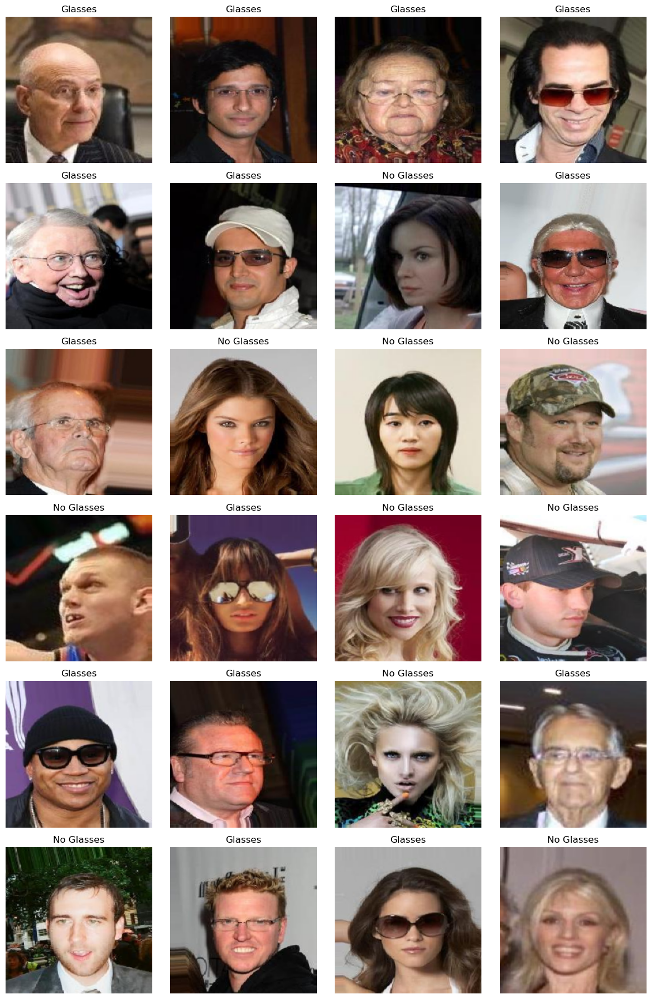

In [5]:
x_batch, y_batch = next(train_gen)
num_images = x_batch.shape[0]
cols = 4
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
axes = axes.flatten()

for i in range(num_images):
    ax = axes[i]
    ax.imshow(x_batch[i])
    label = "Glasses" if y_batch[i] == 0 else "No Glasses"
    ax.set_title(label)
    ax.axis('off')

for i in range(num_images, len(axes)):
    axes[i].axis('off')

plt.tight_layout()
plt.show()

# Set up and configure a model for training

In [6]:
# These two models are also not bad
# base_model = MobileNet(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # Is correct on the test data, but not on my own
# base_model = MobileNetV2(weights="imagenet", include_top=False, input_shape=(224, 224, 3)) # Works for my images, but isn't correct on the test data

base_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
# base_model.trainable = False

base_model.trainable = True
for layer in base_model.layers[:-50]:
    layer.trainable = False

model = Sequential([
    base_model,
    Flatten(),
    Dense(1024, activation='relu'),
    Dropout(0.5),
    Dense(1, activation='sigmoid')
])

# model = Sequential([
#     Conv2D(32, kernel_s, activation='relu', input_shape=(224, 224, 3), kernel_regularizer=regularizers.l2(0.001), padding="VALID"),
#     MaxPooling2D((2,2)),

#     Conv2D(64, kernel_s, activation='relu'),
#     MaxPooling2D((2,2)),

#     Conv2D(64, kernel_s, activation='relu'),
#     MaxPooling2D((2,2)),

#     Conv2D(128, kernel_s, activation='relu'),
#     MaxPooling2D((2,2)),

#     Conv2D(128, kernel_s, activation='relu'),
#     MaxPooling2D((2,2)),

#     # Last layer decise -> preparation for this = some layers before
#     Flatten(),
#     Dense(1024, activation='relu'),
#     Dropout(0.5),
#     Dense(1, activation='sigmoid')
# ])

model.summary()

2025-07-31 07:43:50.747049: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46725 MB memory:  -> device: 1, name: NVIDIA RTX A6000, pci bus id: 0000:73:00.0, compute capability: 8.6


Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 5, 5, 2048)        21802784  
                                                                 
 flatten (Flatten)           (None, 51200)             0         
                                                                 
 dense (Dense)               (None, 1024)              52429824  
                                                                 
 dropout (Dropout)           (None, 1024)              0         
                                                                 
 dense_1 (Dense)             (None, 1)                 1025      
                                                                 
Total params: 74233633 (283.18 MB)
Trainable params: 59604161 (227.37 MB)
Non-trainable params: 14629472 (55.81 MB)
_________________________________________________________________


# Compile the model and start the training

In [7]:
model.compile(optimizer='adam',
              loss='binary_crossentropy',
              metrics=['acc'])

history = model.fit(
    train_gen,
    batch_size=batch_size,
    epochs=40,
    validation_data=valid_gen,
    steps_per_epoch=len(train_gen), # 100
    callbacks=[early_stopping]
)

Epoch 1/40


2025-07-31 07:44:20.298033: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2025-07-31 07:44:24.026973: I external/local_xla/xla/service/service.cc:168] XLA service 0x7ff6208752a0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-07-31 07:44:24.027042: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-07-31 07:44:24.032575: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1753947864.154233   14003 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


267/267 [==============================] - 70s 216ms/step - loss: 0.6856 - acc: 0.9277 - val_loss: 0.0622 - val_acc: 0.9812
Epoch 2/40
267/267 [==============================] - 54s 201ms/step - loss: 0.0761 - acc: 0.9755 - val_loss: 0.0874 - val_acc: 0.9775
Epoch 3/40
267/267 [==============================] - 53s 199ms/step - loss: 0.0471 - acc: 0.9833 - val_loss: 0.1137 - val_acc: 0.9663
Epoch 4/40
267/267 [==============================] - 54s 201ms/step - loss: 0.0489 - acc: 0.9855 - val_loss: 0.0764 - val_acc: 0.9800
Epoch 5/40
267/267 [==============================] - 54s 203ms/step - loss: 0.0342 - acc: 0.9894 - val_loss: 0.0673 - val_acc: 0.9787
Epoch 6/40
267/267 [==============================] - 54s 203ms/step - loss: 0.0271 - acc: 0.9889 - val_loss: 0.0738 - val_acc: 0.9862


# Data Augmenation Pipeline

In [11]:
def generate_random_config():
    return {
        'rotation': random.uniform(0, 10),             
        'zoom': random.uniform(0, 0.25),             
        'width_shift': random.uniform(0, 0.1),
        'height_shift': random.uniform(0, 0.1),
        'shear': random.uniform(0, 0.1),           
        'hflip': True,                                
        'brightness': random.choice([[0.7, 1.3], [0.8, 1.2], None]) 
}

results = []

for i in range(10):
    config = generate_random_config()
    print(f"\n[INFO] Running config {i+1}: {config}")
    pipeline = DataAugmentationPipeline(config=config, batch_size=batch_size, target_size=target_size, class_mode='binary')
    
    train_gen = pipeline.get_train_generator()
    valid_gen = pipeline.get_valid_generator()
    test_gen = pipeline.get_test_generator()
    
    # Build the model for each iteration new
    base_model = InceptionV3(weights="imagenet", include_top=False, input_shape=(224, 224, 3))
    # base_model.trainable = False

    base_model.trainable = True
    for layer in base_model.layers[:-50]:
        layer.trainable = False

    model = Sequential([
        base_model,
        Flatten(),
        Dense(1024, activation='relu'),
        Dropout(0.5),
        Dense(1, activation='sigmoid')
    ])
    
    model.compile(optimizer='adam',
                  loss='binary_crossentropy',
                  metrics=['acc'])

    history = model.fit(
        train_gen,
        batch_size=batch_size,
        epochs=40,
        validation_data=valid_gen,
        steps_per_epoch=100,
        callbacks=[early_stopping]
    )
    
    # Evaluate on test dataset
    test_loss, test_acc = model.evaluate(test_gen, verbose=0)
    
    results.append({
        'config': config,
        'val_acc': max(history.history['val_acc']),
        'test_acc': test_acc,
        'history': history.history
    })

# Sorted after best test accuracy
results = sorted(results, key=lambda x: x['test_acc'], reverse=True)

for r in results:
    print(f"\nConfig: {r['config']}\n-> Val Acc: {r['val_acc']:.4f} | Test Acc: {r['test_acc']:.4f}")


[INFO] Running config 1: {'rotation': 6.733787228770899, 'zoom': 0.11582383344107686, 'width_shift': 0.03212384336191026, 'height_shift': 0.048905757401982136, 'shear': 0.07831471428027012, 'hflip': True, 'brightness': None}
Found 6400 images belonging to 2 classes.
Found 800 images belonging to 2 classes.
Found 800 images belonging to 2 classes.


2025-07-10 05:53:28.606513: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1929] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 46733 MB memory:  -> device: 0, name: NVIDIA RTX A6000, pci bus id: 0000:17:00.0, compute capability: 8.6


Epoch 1/40


2025-07-10 05:53:37.316060: I external/local_xla/xla/stream_executor/cuda/cuda_dnn.cc:454] Loaded cuDNN version 8902
2025-07-10 05:53:41.055485: I external/local_xla/xla/service/service.cc:168] XLA service 0x7f10a09645c0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2025-07-10 05:53:41.055523: I external/local_xla/xla/service/service.cc:176]   StreamExecutor device (0): NVIDIA RTX A6000, Compute Capability 8.6
2025-07-10 05:53:41.061644: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1752126821.186466     974 device_compiler.h:186] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


100/100 [==============================] - 38s 254ms/step - loss: 2.0562 - acc: 0.8829 - val_loss: 0.3643 - val_acc: 0.9712
Epoch 2/40
100/100 [==============================] - 23s 230ms/step - loss: 0.2336 - acc: 0.9457 - val_loss: 0.0854 - val_acc: 0.9737
Epoch 3/40
100/100 [==============================] - 21s 214ms/step - loss: 0.1146 - acc: 0.9632 - val_loss: 0.0723 - val_acc: 0.9750
Epoch 4/40
100/100 [==============================] - 22s 215ms/step - loss: 0.0894 - acc: 0.9699 - val_loss: 0.0962 - val_acc: 0.9588
Epoch 5/40
100/100 [==============================] - 22s 215ms/step - loss: 0.1020 - acc: 0.9678 - val_loss: 0.0504 - val_acc: 0.9850
Epoch 6/40
100/100 [==============================] - 21s 214ms/step - loss: 0.0715 - acc: 0.9791 - val_loss: 0.0582 - val_acc: 0.9775
Epoch 7/40
100/100 [==============================] - 21s 211ms/step - loss: 0.0570 - acc: 0.9778 - val_loss: 0.0704 - val_acc: 0.9775
Epoch 8/40
100/100 [==============================] - 21s 211ms/st

# Plot the results of the training with a Data Augmentation Pipeline

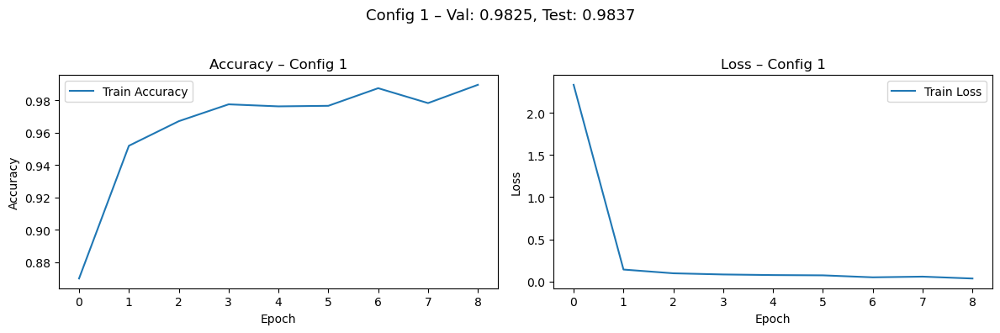

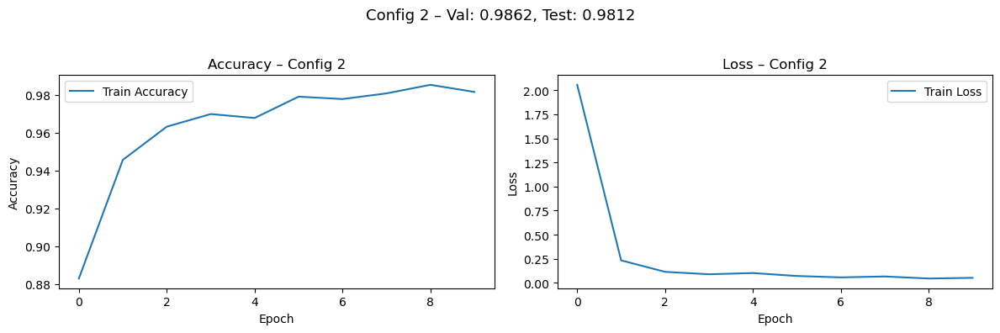

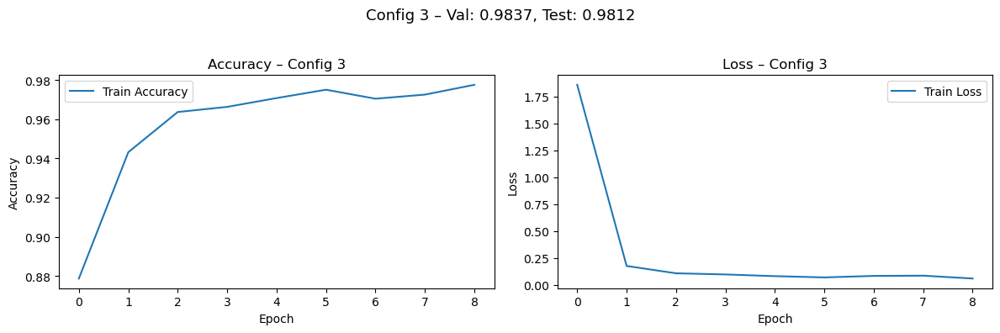

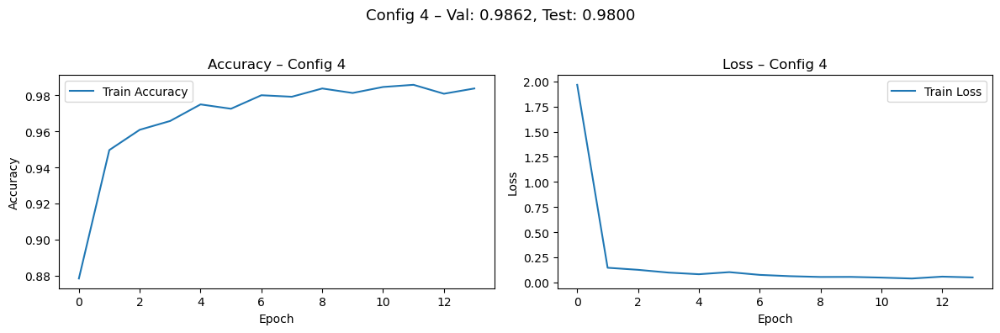

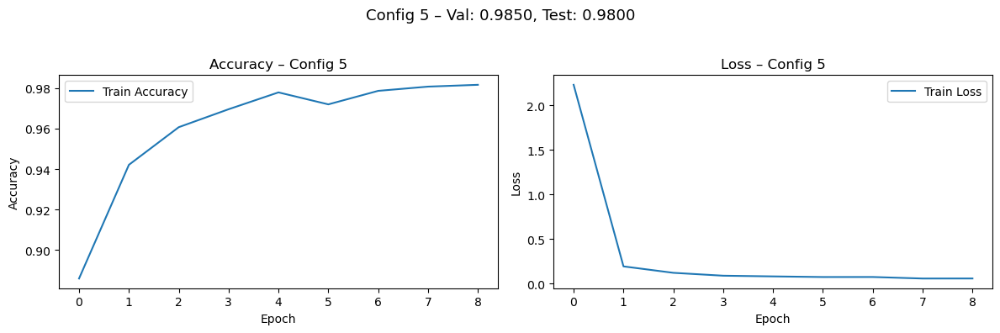

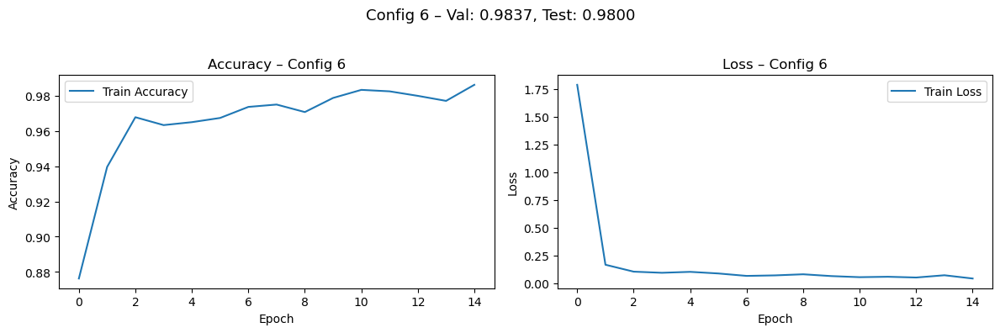

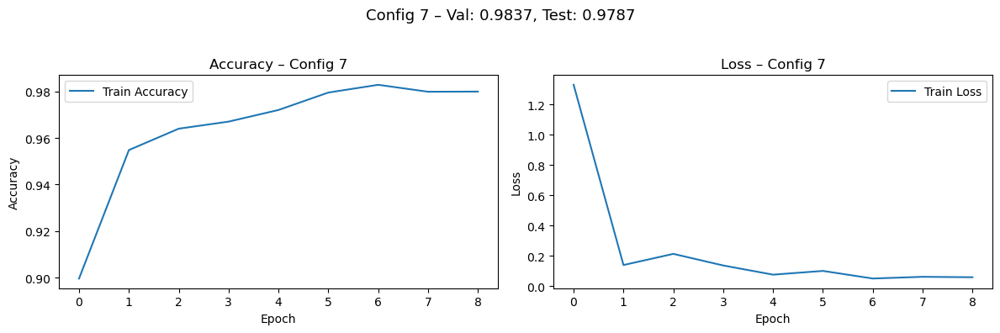

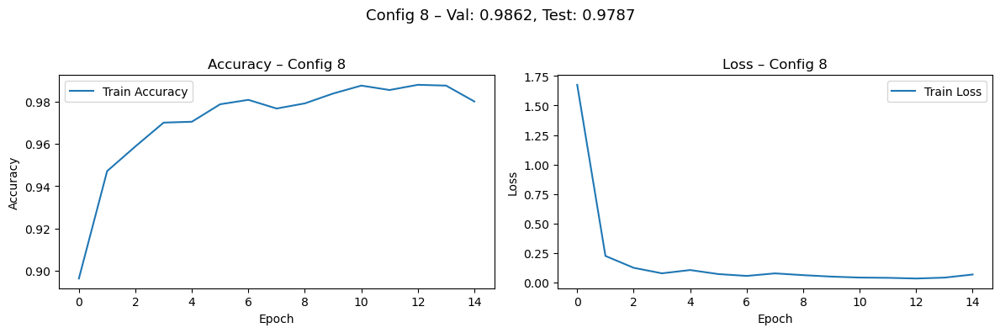

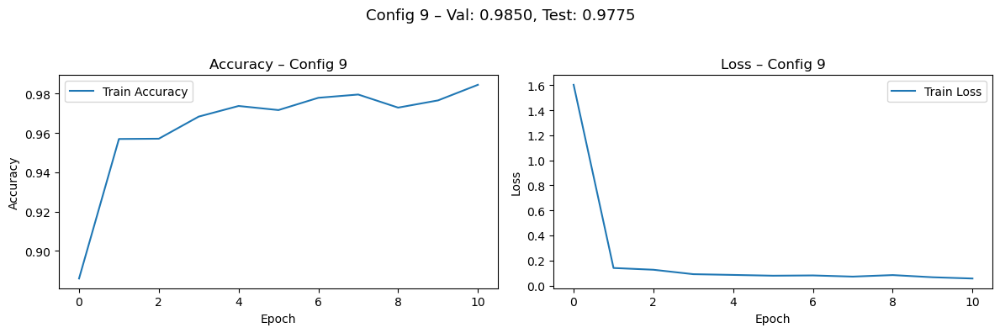

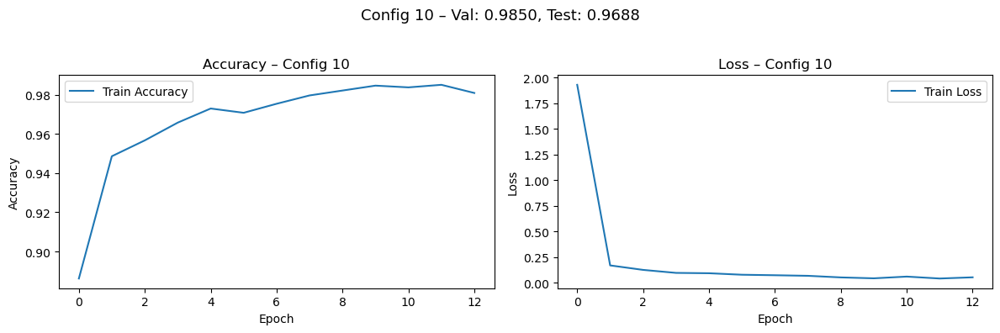

In [12]:
for i, r in enumerate(results):
    history = r.get('history', None)
    
    if history is None:
        print(f"[WARNING] No training history for config {i+1} available – please log the history.")
        continue

    config = r['config']
    val_acc = r['val_acc']
    test_acc = r['test_acc']

    acc_key = 'accuracy' if 'accuracy' in history else 'acc'
    val_acc_key = 'val_accuracy' if 'val_accuracy' in history else 'val_acc'

    plt.figure(figsize=(12, 4))

    plt.subplot(1, 2, 1)
    plt.plot(history[acc_key], label='Train Accuracy')
    plt.title(f'Accuracy – Config {i+1}')
    plt.xlabel('Epoch')
    plt.ylabel('Accuracy')
    plt.legend()

    plt.subplot(1, 2, 2)
    plt.plot(history['loss'], label='Train Loss')
    plt.title(f'Loss – Config {i+1}')
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()

    plt.suptitle(f'Config {i+1} – Val: {val_acc:.4f}, Test: {test_acc:.4f}', fontsize=13)
    plt.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()

# Plot the results of the training

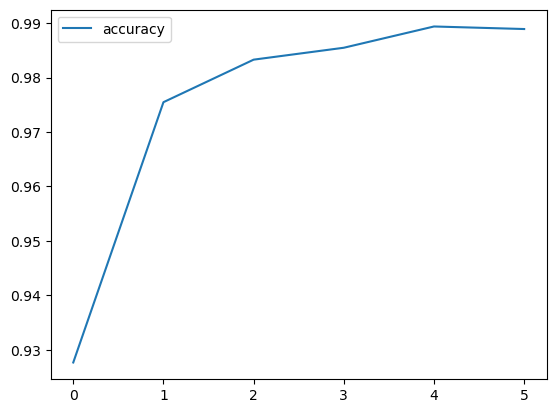

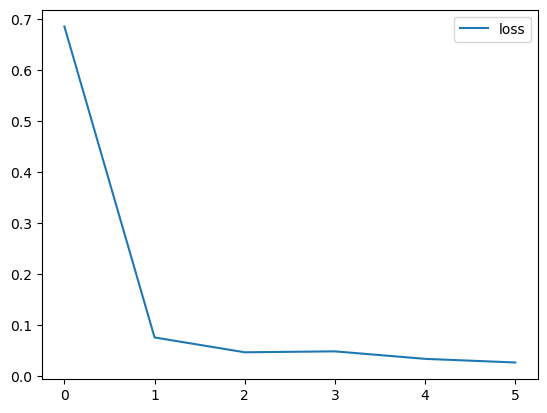

In [8]:
plt.plot(history.history['acc'], label='accuracy')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='loss')
plt.legend()

# Test the model on the test data

1/1 [==============================] - 1s 1s/step


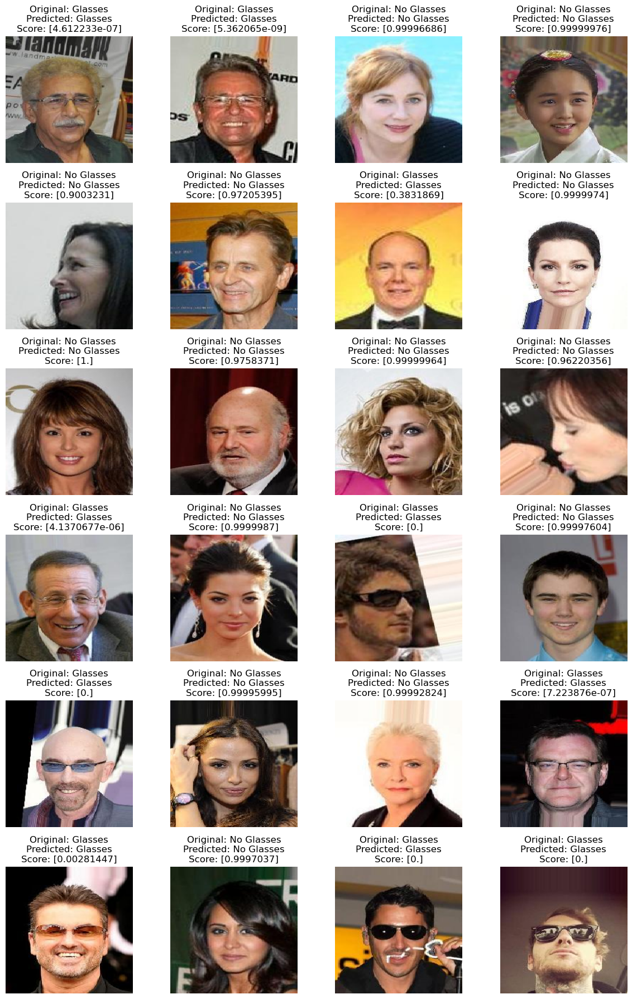

In [9]:
x_batch, y_batch = next(test_gen)
predictions = model.predict(x_batch)

# print(f"Predictions {predictions}")
predicted_labels = (predictions > 0.5).astype(int).flatten()
# print(predicted_labels)

num_images = x_batch.shape[0]
cols = 4
rows = (num_images + cols - 1) // cols

fig, axes = plt.subplots(rows, cols, figsize=(12, 3 * rows))
axes = axes.flatten()

class_names = ["Glasses", "No Glasses"]

for i in range(num_images):
    ax = axes[i]
    ax.imshow(x_batch[i])
    
    true_label = class_names[int(y_batch[i])]
    predicted_label = class_names[predicted_labels[i]]
    
    ax.set_title(f"Original: {true_label}\nPredicted: {predicted_label}\nScore: {predictions[i]}")
    ax.axis('off')
    
plt.tight_layout()
plt.show()

# Test the model on my own data

1/1 [==============================] - 1s 1s/step


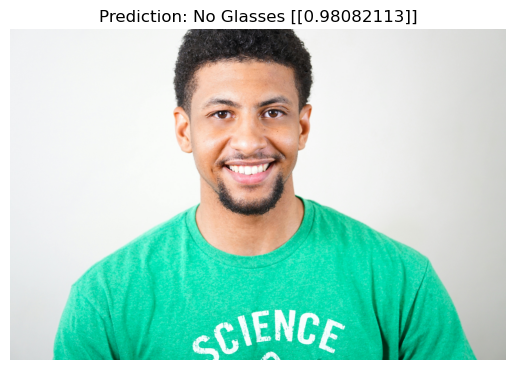

1/1 [==============================] - 0s 35ms/step


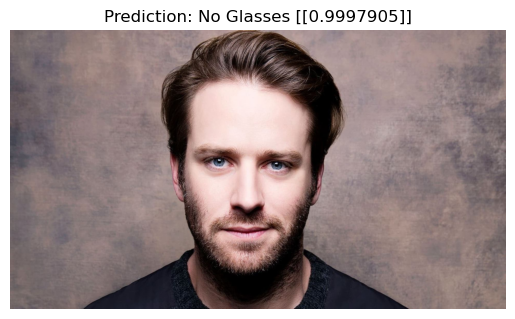

1/1 [==============================] - 0s 35ms/step


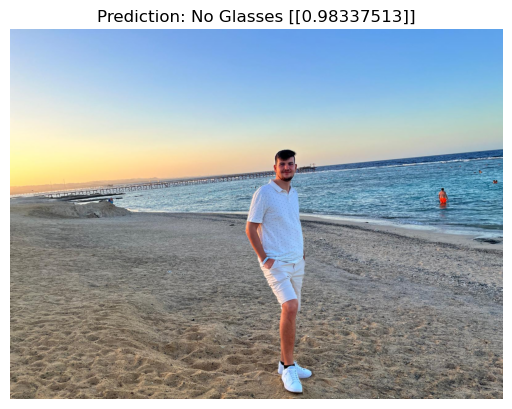

1/1 [==============================] - 0s 30ms/step


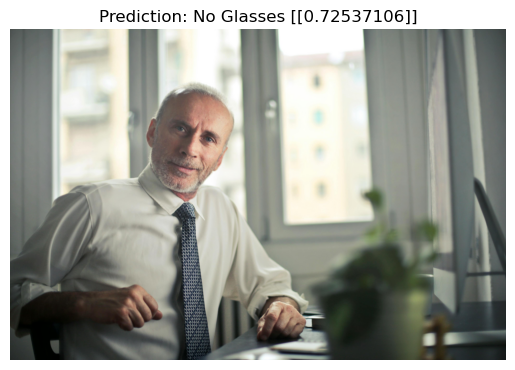

1/1 [==============================] - 0s 35ms/step


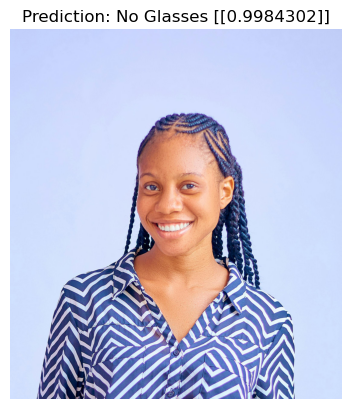

1/1 [==============================] - 0s 35ms/step


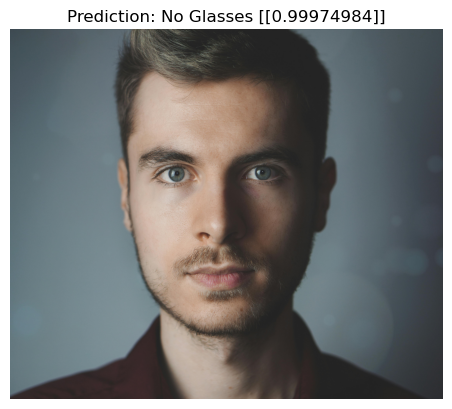

1/1 [==============================] - 0s 36ms/step


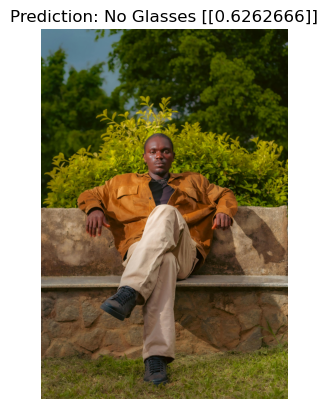

1/1 [==============================] - 0s 33ms/step


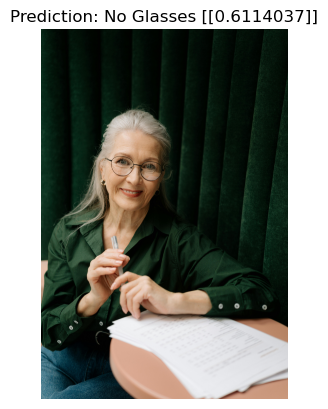

1/1 [==============================] - 0s 33ms/step


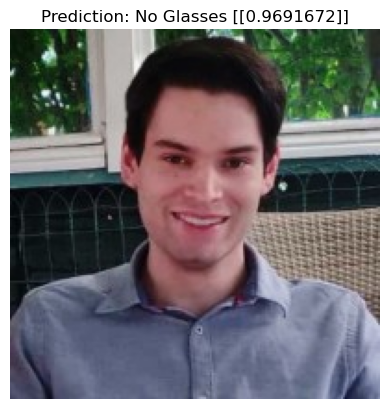

1/1 [==============================] - 0s 32ms/step


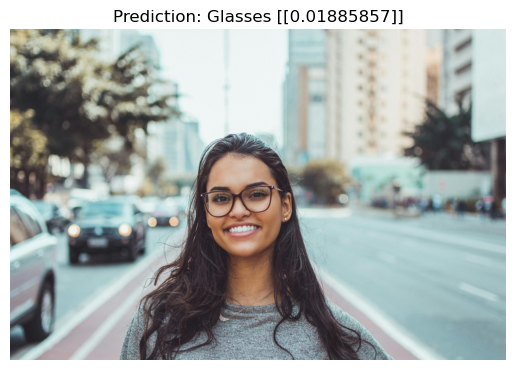

1/1 [==============================] - 0s 36ms/step


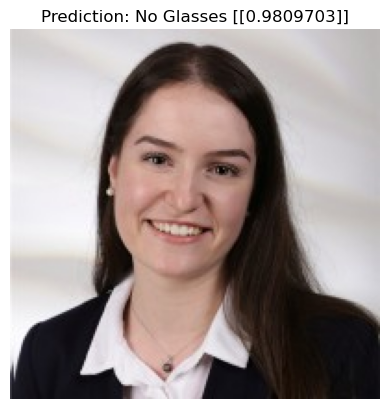

1/1 [==============================] - 0s 33ms/step


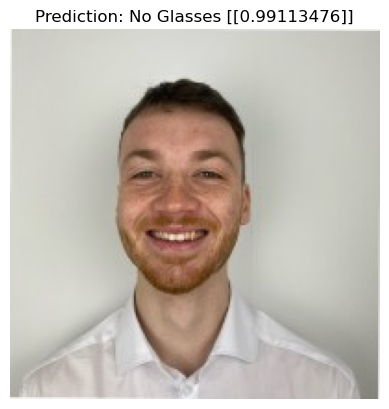

1/1 [==============================] - 0s 30ms/step


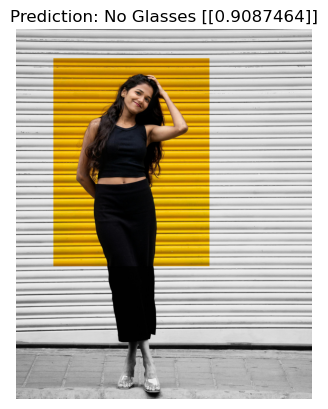

1/1 [==============================] - 0s 34ms/step


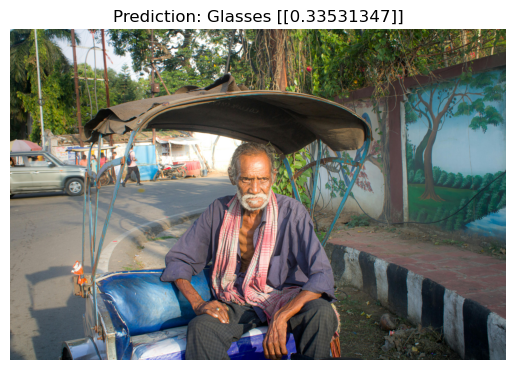

In [10]:
def edit_image(image_path: str) -> np.array: 
    img = load_img(image_path, target_size=target_size)

    img_array = img_to_array(img)
    img_array = img_array / 255.0 

    img_array = np.expand_dims(img_array, axis=0)
    
    return img_array

class_names = ["Glasses", "No Glasses"]

images = glob.glob('../Images/*.jpg')

for i, image in enumerate(images):
    img_array = edit_image(image)
    
    prediction = model.predict(img_array)
    predicted_labels = (prediction > 0.5).astype(int).flatten()
    predicted_label = class_names[predicted_labels[0]]

    plt.imshow(load_img(image))
    plt.title(f"Prediction: {predicted_label} {prediction}")
    plt.axis("off")
    plt.show()

# Evaluate the model ans save it to a file

In [11]:
model.evaluate(test_gen)
model.save("../Models/With_DA_Pipeline/Glasses_classification")

34/34 [==============================] - 1s 34ms/step - loss: 0.0719 - acc: 0.9825
INFO:tensorflow:Assets written to: ../Models/With_DA_Pipeline/Glasses_classification/assets


INFO:tensorflow:Assets written to: ../Models/With_DA_Pipeline/Glasses_classification/assets


# Test the model on detected and extracted faces

Loading the model: Glasses_classification
Predicting with the model which was trained with the pipeline:


W0000 00:00:1753948626.426408   23504 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


1/1 [==============================] - 1s 1s/step


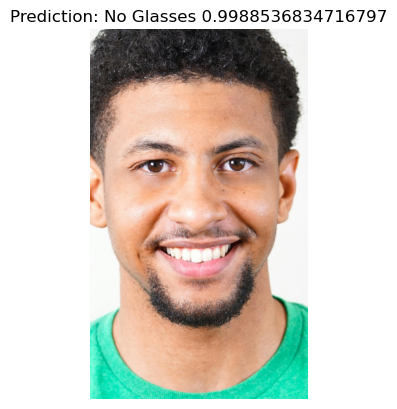

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948628.254626   23556 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


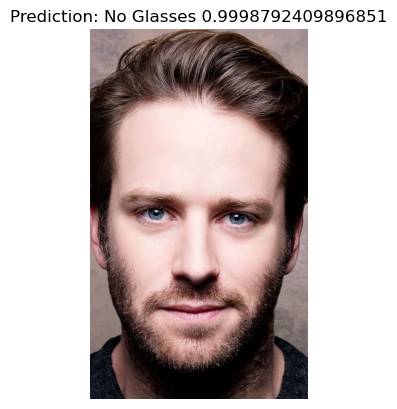

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948628.555223   23600 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


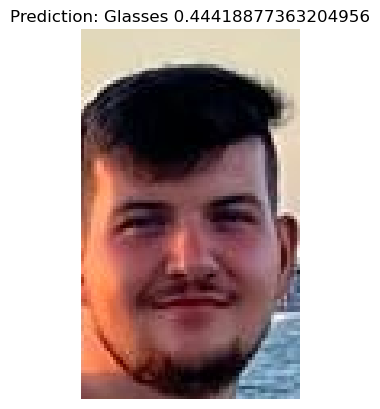

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948628.826539   23642 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


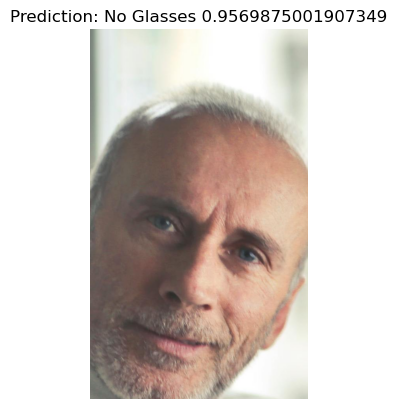

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948629.151345   23685 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


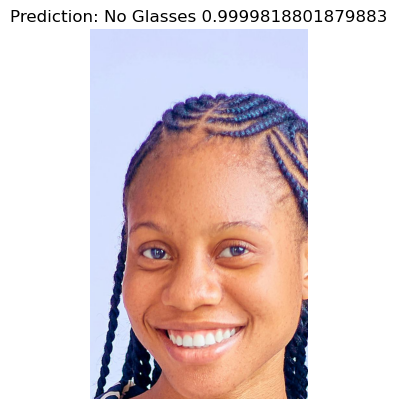

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948629.598297   23729 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


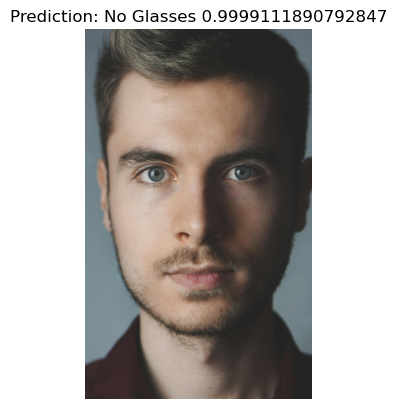

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948630.758005   23772 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


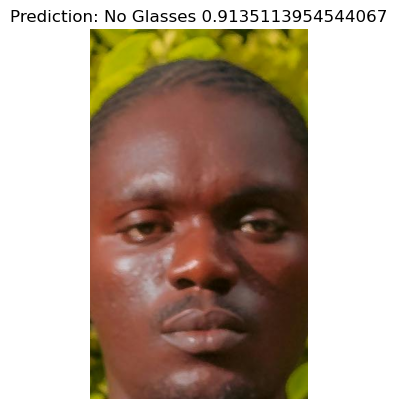

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948631.264374   23814 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


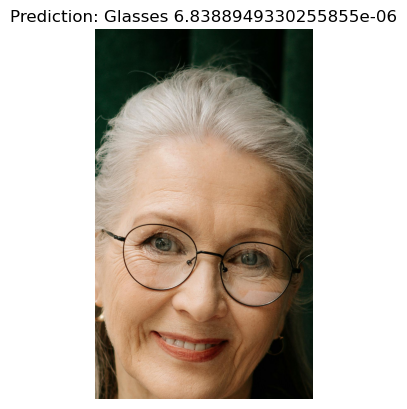

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948631.663259   23857 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


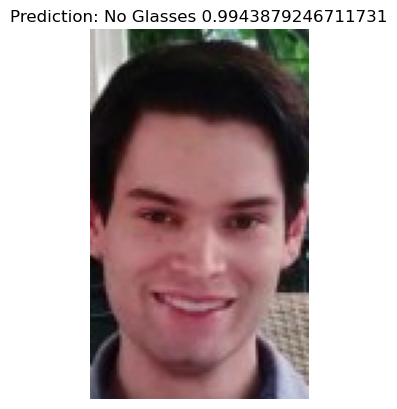

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753948632.199521   23900 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


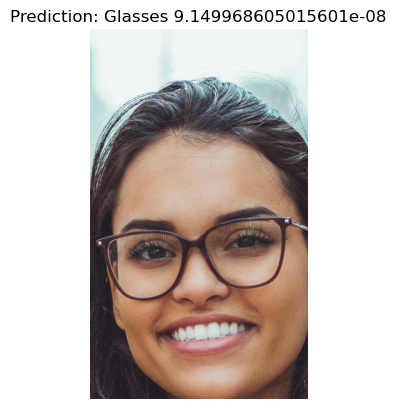

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753948632.588504   23950 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


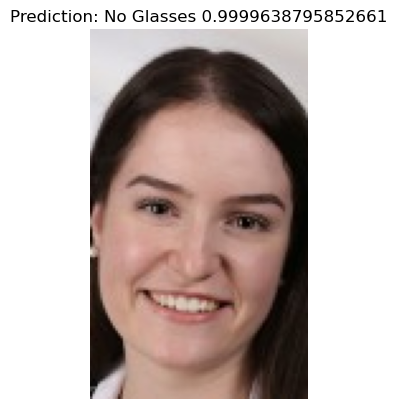

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948632.832675   23993 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


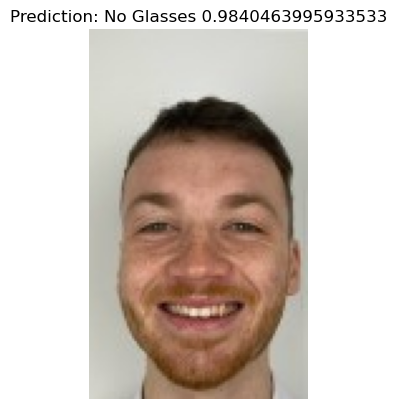

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948633.228467   24036 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


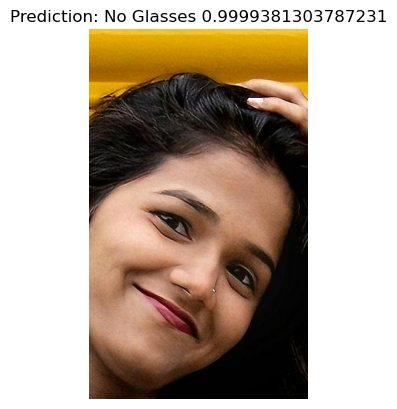

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753948633.780889   24079 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


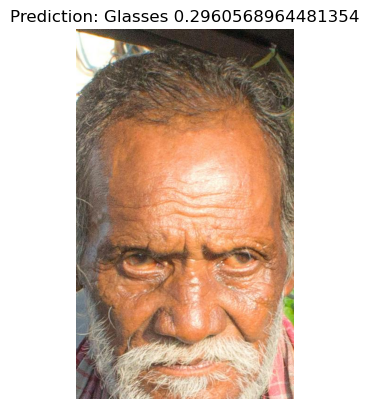

Predicting with the model which was trained without the pipeline:


W0000 00:00:1753948634.304167   24122 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


1/1 [==============================] - 1s 1s/step


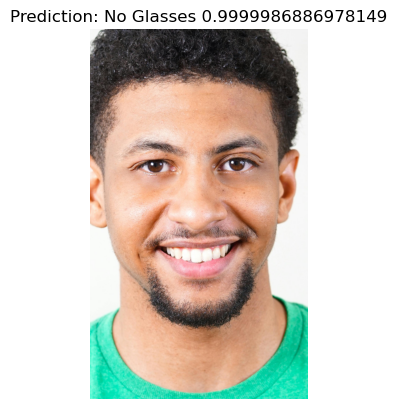

1/1 [==============================] - 0s 38ms/step


W0000 00:00:1753948636.025297   24166 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


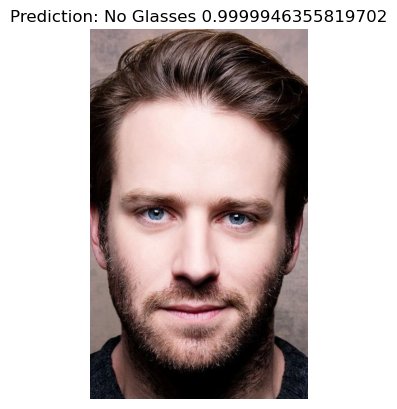

1/1 [==============================] - 0s 34ms/step


W0000 00:00:1753948636.326349   24209 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


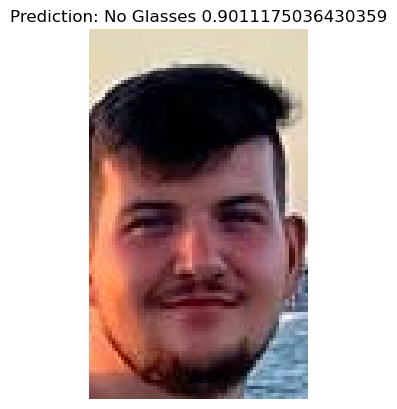

1/1 [==============================] - 0s 31ms/step


W0000 00:00:1753948636.618670   24252 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


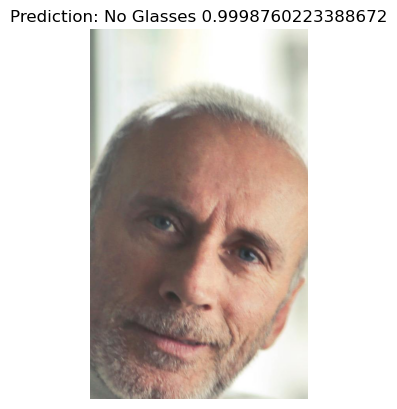

1/1 [==============================] - 0s 44ms/step


W0000 00:00:1753948636.939766   24295 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


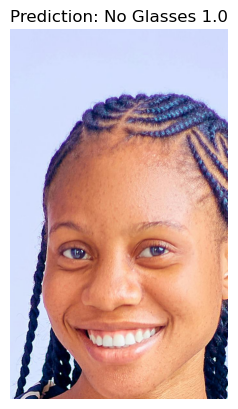

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948637.394134   24339 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


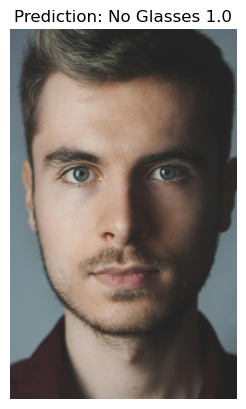

1/1 [==============================] - 0s 34ms/step


W0000 00:00:1753948638.554854   24389 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


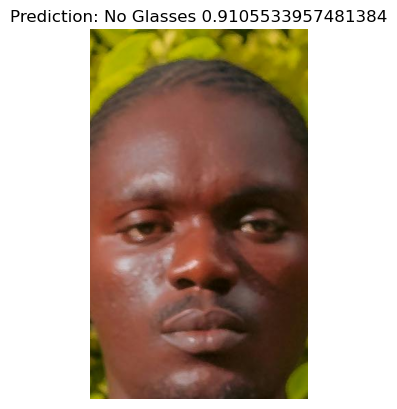

1/1 [==============================] - 0s 31ms/step


W0000 00:00:1753948639.068108   24432 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


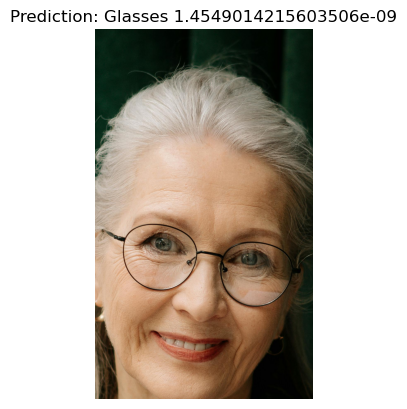

1/1 [==============================] - 0s 32ms/step


W0000 00:00:1753948639.459850   24475 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


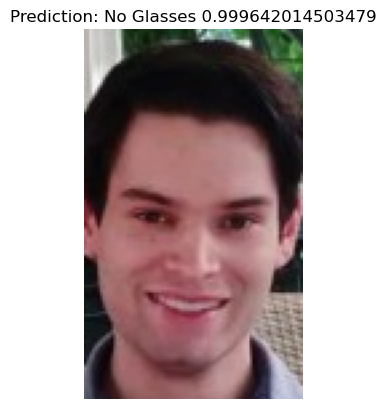

1/1 [==============================] - 0s 31ms/step


W0000 00:00:1753948639.960136   24518 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


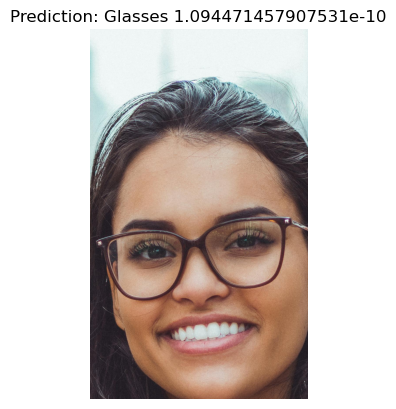

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948640.334788   24562 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


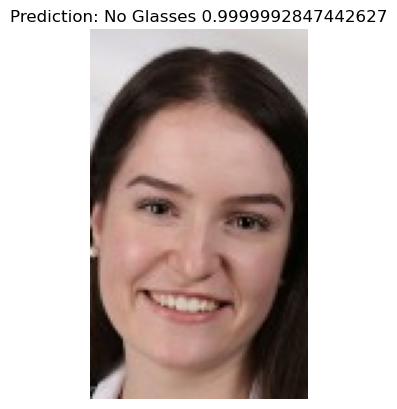

1/1 [==============================] - 0s 36ms/step


W0000 00:00:1753948640.568990   24604 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


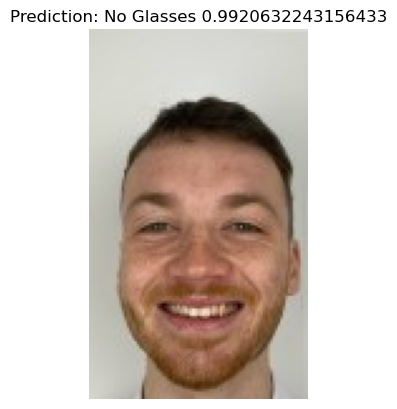

1/1 [==============================] - 0s 35ms/step


W0000 00:00:1753948640.913673   24647 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


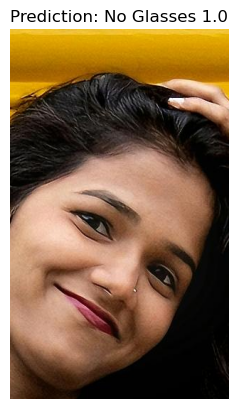

1/1 [==============================] - 0s 30ms/step


W0000 00:00:1753948641.466855   24690 inference_feedback_manager.cc:114] Feedback manager requires a model with a single signature inference. Disabling support for feedback tensors.


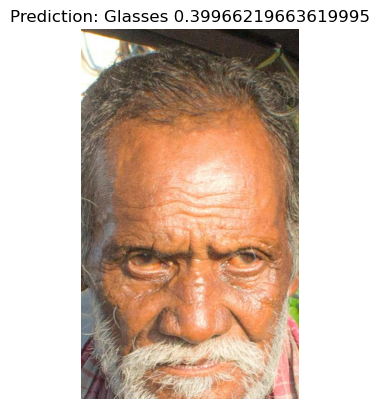

In [15]:
print(f"Loading the model: Glasses_classification")
model_with_pipeline = load_model("../Models/With_DA_Pipeline/Glasses_classification")
model_without_pipeline = load_model("../Models/Without_DA_Pipeline/Glasses_classification")

print("Predicting with the model which was trained with the pipeline:")
predict_detected_faces(model=model_with_pipeline, class_names=class_names, padding=0.3, image_directory="../Images/*.jpg", categorical=False)

print("Predicting with the model which was trained without the pipeline:")
predict_detected_faces(model=model_without_pipeline, class_names=class_names, padding=0.3, image_directory="../Images/*.jpg", categorical=False)